In [7]:
%matplotlib inline
import pandas as pd
import geopandas as gpd
import libpysal as lp
import matplotlib.pyplot as plt
import rasterio as rio
import numpy as np
import contextily as ctx
import shapely.geometry as geom

In [2]:
df = gpd.read_file('berlin-districts.geojson')

<AxesSubplot:>

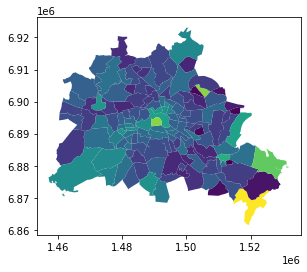

In [3]:
df.plot(column='median_price')

<AxesSubplot:>

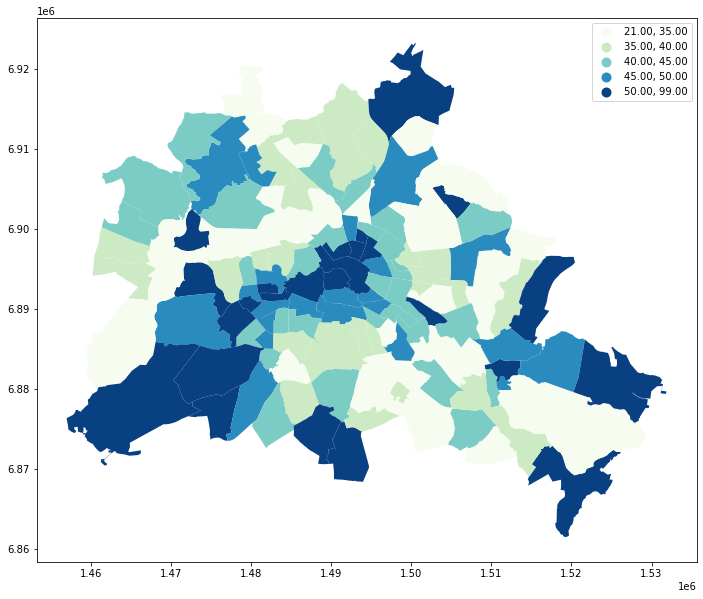

In [4]:
fig, ax = plt.subplots(figsize=(12,10), subplot_kw=dict(aspect='equal'))
df.plot(column='median_price', scheme='Quantiles', k=5, cmap='GnBu', legend=True, ax=ax)

## Spatial similarity

In [13]:
wq = lp.weights.Queen.from_dataframe(df)
wq.transform = 'r'

### Attribute similarity 

Spatial weight between districts i and j indicates if the two are neighbors (geographically similar). 

We need a measure of attribute similarity to apir up with this concept of spatial similarity. The spatial lag is a derived variable that accomplishes this. 

In [14]:
# For district i the spatial lag is defined as:

y = df['median_price']
ylag = lp.weights.lag_spatial(wq, y)
ylag

array([45.2       , 52.625     , 45.75      , 32.5       , 63.5       ,
       42.        , 45.625     , 44.14285714, 43.33333333, 38.75      ,
       41.5       , 50.8       , 36.6875    , 54.36363636, 54.375     ,
       38.92857143, 38.125     , 50.9       , 35.6875    , 59.66666667,
       46.875     , 46.92857143, 49.58333333, 47.25      , 53.25      ,
       40.57142857, 37.66666667, 37.14285714, 40.75      , 41.5       ,
       45.9       , 35.3       , 47.9375    , 47.33333333, 40.        ,
       44.        , 58.3       , 53.16666667, 42.166     , 43.75      ,
       51.625     , 52.3       , 50.5       , 46.91666667, 47.        ,
       38.125     , 35.33333333, 48.83333333, 46.6       , 43.125     ,
       40.805     , 41.33333333, 42.        , 45.7075    , 55.66666667,
       46.2       , 47.33333333, 50.47875   , 49.2075    , 42.92857143,
       43.4       , 40.78571429, 37.42857143, 32.75      , 45.57142857,
       51.25      , 44.        , 33.33333333, 33.25      , 42.  

In [16]:
import mapclassify as mc
ylagq5 = mc.Quantiles(ylag, k=5)

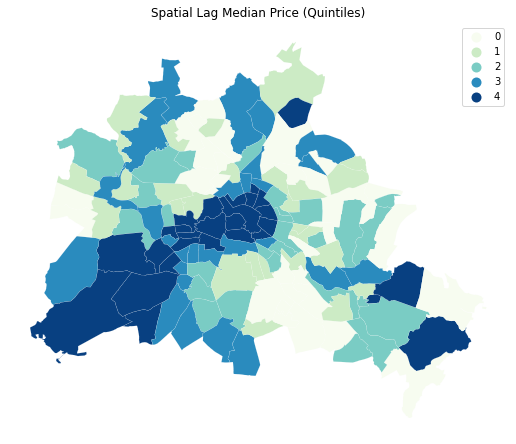

In [17]:
f, ax = plt.subplots(1, figsize=(9, 9), subplot_kw=dict(aspect='equal'))
df.assign(cl=ylagq5.yb).plot(column='cl', categorical=True, k=5, cmap='GnBu', linewidth=0.1, edgecolor='white', legend=True, ax=ax)
ax.set_axis_off()
plt.title('Spatial Lag Median Price (Quintiles)')
plt.show()

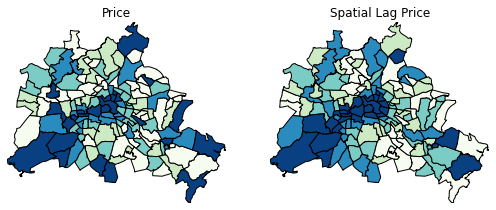

In [18]:
df['lag_median_price'] = ylag
f, ax = plt.subplots(1, 2, figsize=(2.16 * 4, 4), subplot_kw=dict(aspect='equal'))
df.plot(column='median_price', ax=ax[0], edgecolor='k', scheme='quantiles', k=5, cmap='GnBu')
ax[0].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[0].set_title('Price')

df.plot(column='lag_median_price', ax=ax[1], edgecolor='k', scheme='quantiles', k=5, cmap='GnBu')
ax[1].axis(df.total_bounds[np.asarray([0, 2, 1, 3])])
ax[1].set_title('Spatial Lag Price')

ax[0].axis('off')
ax[1].axis('off')
plt.show()

### Global spatial autocorrelation

In [19]:
# Binary case
y.median()

42.0

In [20]:
yb = y > y.median()
sum(yb)
# we have 68 districts with nightly Airbnb prices above the median and 70 below the median

68

In [21]:
yb = y > y.median()
labels = ['0 Low', '1 High']
yb = [labels[i] for i in 1 * yb]
df['yb'] = yb

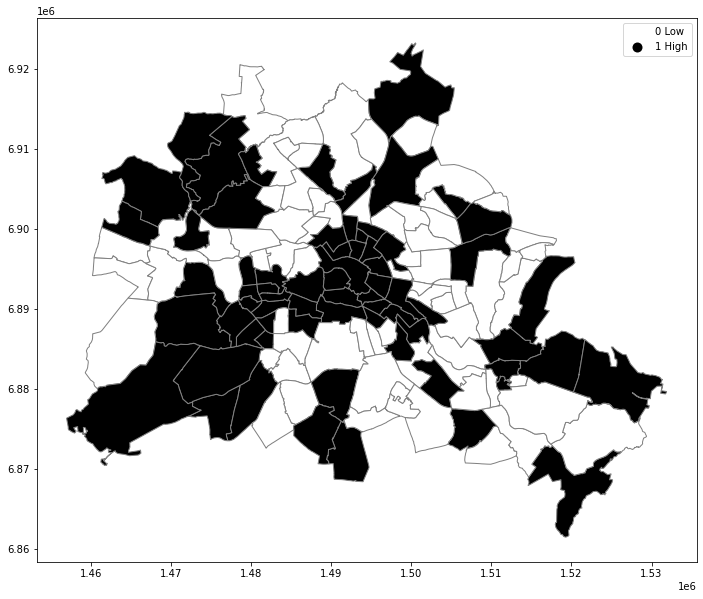

In [22]:
# The spatial distribution of the binary variable immediately raises questions about the juxtaposition of the 'black' and 'white' areas
fig = plt.figure(figsize=(12, 10))
ax = plt.gca()
df.plot(column='yb', cmap='binary', edgecolor='grey', legend=True, ax=ax)
plt.show()
# black are above median, low are below median

### Join counts

Join exists for each neighbor pair of observations, and the joins are reflected in our binary spatial weights object wq

Each unit can take on one of two values 'black' and 'white'. For a given pair there are three different types of joins that can arise:

- Black Black (BB)
- White White (WW)
- Black White (BW)

In [24]:
# Using esda package from PySAL to carry out join count analysis
import esda

yb = 1 * (y > y.median()) # convert back to binary
wq = lp.weights.Queen.from_dataframe(df)
wq.transform = 'b'
np.random.seed(12345)
jc = esda.join_counts.Join_Counts(yb, wq)

In [25]:
jc.bb

121.0

In [26]:
jc.ww

114.0

In [27]:
jc.bw

150.0

In [28]:
# all three cases exhaust all possibilities
jc.bb + jc.ww + jc.bw

385.0

In [29]:
wq.s0 / 2

385.0

In [30]:
# Comparing observed spatial distribution with a random generated one

# Average number of BB joins from the synthetic realizations is
jc.mean_bb

# Which is less than our observed count

92.65365365365365

Text(0.5, 0, 'BB counts')

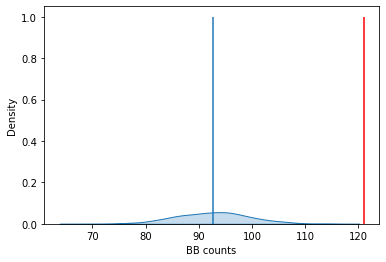

In [40]:
# Is our observed value so different from the expectation that we would reject the null of CSR?
import seaborn as sbn

sbn.kdeplot(jc.sim_bb, shade=True)
plt.vlines(jc.bb, 0, 1, color='r')
plt.vlines(jc.mean_bb, 0, 1)
plt.xlabel('BB counts')
# the density portrays the distribution of the BB counts, with the blue vertical line indicating the mean BB count of synthetic realizations
# red line shows observed BB count for our prices
# Observed value is extremely high

In [41]:
# Pseudo p-value summarizes this
jc.p_sim_bb

0.001

### Continuous case

In [42]:
# Transforming our weights to be row-standardized from the current binary state
wq.transform = 'r'
y = df['median_price']

In [43]:
np.random.seed(12345)
mi = esda.moran.Moran(y, wq)
mi.I

0.09946269199744258

Text(0.5, 0, 'Morans I')

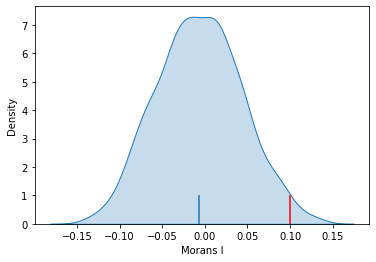

In [44]:
# Value for the statistic needs to be interpreted against a reference distribution under the null of CSR.

sbn.kdeplot(mi.sim, shade=True)
plt.vlines(mi.I, 0, 1, color='r')
plt.vlines(mi.EI, 0, 1)
plt.xlabel('Morans I')

In [45]:
mi.p_sim

0.018

### Local autocorrelations: Hot spots, cold spots, spatial outliers

In [46]:
np.random.seed(12345)
wq.transform = 'r'
lag_price = lp.weights.lag_spatial(wq, df['median_price'])

price = df['median_price']

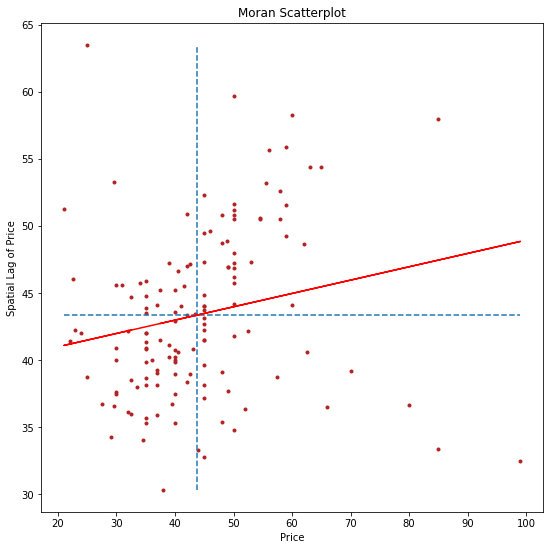

In [48]:
b, a = np.polyfit(price, lag_price, 1)
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(price, lag_price, '.', color='firebrick')

# dashed vert at mean of price
plt.vlines(price.mean(), lag_price.min(), lag_price.max(), linestyles='--')
# dashed horizontal at mean of lagged price
plt.hlines(lag_price.mean(), price.min(), price.max(), linestyles='--')

# red line of best fit using global I as slop
plt.plot(price, a + b * price, 'r')
plt.title('Moran Scatterplot')
plt.ylabel('Spatial Lag of Price')
plt.xlabel('Price')
plt.show()

In [56]:
# Instead of a single I statistic, we have an array of local I statistics stored in .Is attribute, and p-values from the simulation are in p_sim
li = esda.moran.Moran_Local(y, wq)
li.q

array([2, 1, 1, 4, 2, 3, 2, 1, 3, 4, 3, 1, 3, 1, 1, 3, 3, 2, 3, 1, 1, 1,
       1, 2, 2, 3, 4, 4, 3, 4, 2, 3, 1, 1, 3, 1, 1, 1, 4, 4, 1, 1, 1, 1,
       2, 3, 3, 1, 2, 4, 3, 3, 3, 2, 1, 1, 1, 1, 1, 3, 3, 3, 3, 4, 2, 2,
       2, 4, 4, 3, 3, 4, 3, 4, 2, 4, 4, 1, 2, 1, 4, 3, 4, 2, 3, 3, 3, 3,
       3, 3, 4, 3, 4, 3, 4, 1, 1, 1, 3, 3, 1, 1, 1, 3, 4, 1, 4, 2, 3, 1,
       1, 2, 4, 2, 2, 2, 1, 1, 3, 3, 4, 1, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 4, 3, 3, 3])

In [57]:
# testing for local clustering using permuatations, here we use conditional random permutations
(li.p_sim < 0.05).sum()

23

In [58]:
# We can distinguish the specific type of local spatial association reflected in the four quandrants of the Moran Scatterplot above
sig = li.p_sim < 0.05
hotspot = sig * li.q == 1
coldspot = sig * li.q == 3
doughnut = sig * li.q == 2
diamond = sig * li.q == 4

In [59]:
spots = ['n.sig', 'hot spot']
labels = [spots[i] for i in hotspot * 1]

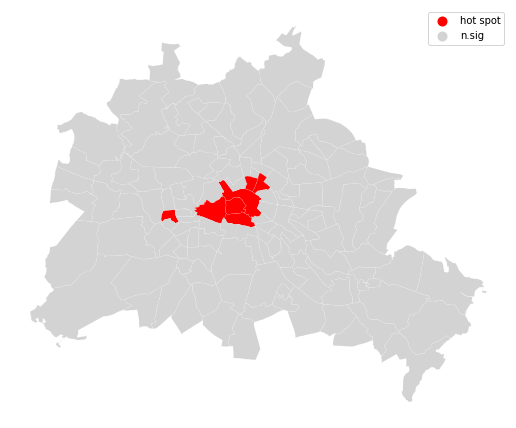

In [60]:
df = df
from matplotlib import colors
hmap = colors.ListedColormap(['red', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(9, 9))
df.assign(cl=labels).plot(column='cl', categorical=True, k=2, cmap=hmap, linewidth=0.1, ax=ax, edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()
# mapping districts located in quadrant 1, high value, high valued neighbors
# others are not significant

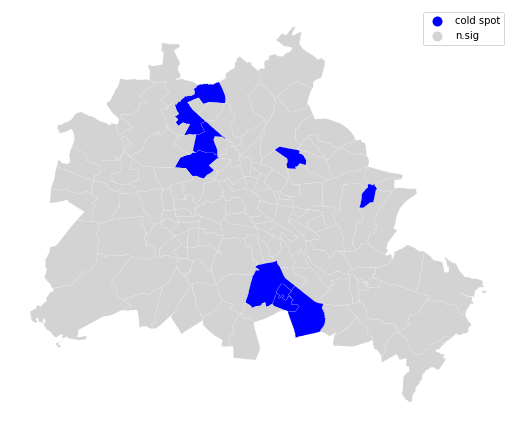

In [61]:
spots = ['n.sig', 'cold spot']
labels = [spots[i] for i in coldspot * 1]

df = df
from matplotlib import colors
hmap = colors.ListedColormap(['blue', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(9, 9))
df.assign(cl=labels).plot(column='cl', categorical=True, k=2, cmap=hmap, linewidth=0.1, ax=ax, edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()
# showing districts located in third quadrant, low value, low valued neighbors

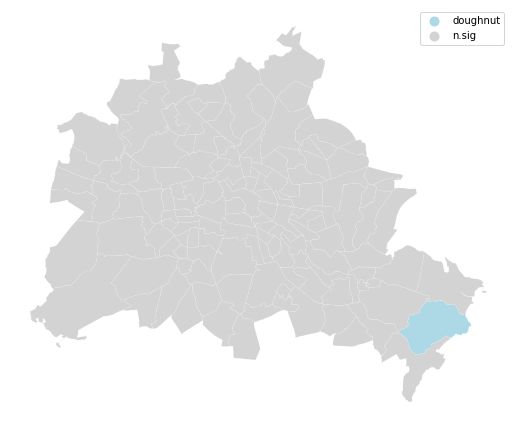

In [62]:
spots = ['n.sig', 'doughnut']
labels = [spots[i] for i in doughnut * 1]

df = df
from matplotlib import colors
hmap = colors.ListedColormap(['lightblue', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(9, 9))
df.assign(cl=labels).plot(column='cl', categorical=True, k=2, cmap=hmap, linewidth=0.1, ax=ax, edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()
# districts with low value surrounded by high valued districts

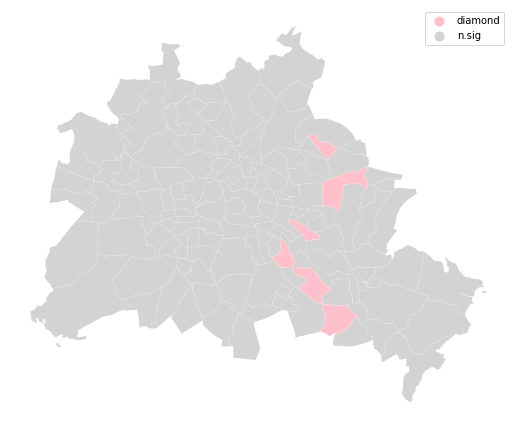

In [63]:
spots = ['n.sig', 'diamond']
labels = [spots[i] for i in diamond * 1]

df = df
from matplotlib import colors
hmap = colors.ListedColormap(['pink', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(9, 9))
df.assign(cl=labels).plot(column='cl', categorical=True, k=2, cmap=hmap, linewidth=0.1, ax=ax, edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()

# districts with high value surrounded by low value neighbors

In [64]:
sig = 1 * (li.p_sim < 0.05)
hotspot = 1 * (sig * li.q == 1)
coldspot = 3 * (sig * li.q == 3)
doughnut = 2 * (sig * li.q == 2)
diamond = 4 * (sig * li.q == 4)
spots = hotspot + coldspot + doughnut + diamond
spots

array([0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 0, 0, 3, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0,
       0, 4, 4, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 3, 3, 0, 0, 0, 0, 0,
       3, 0, 0, 0, 3, 0])

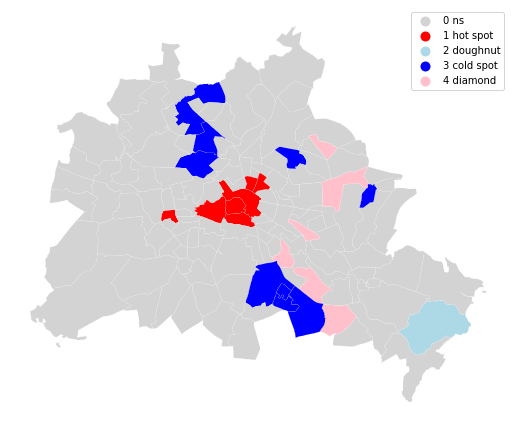

In [66]:
spot_labels = ['0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
labels = [spot_labels[i] for i in spots]

from matplotlib import colors
hmap = colors.ListedColormap(['lightgrey', 'red', 'lightblue', 'blue', 'pink'])
f, ax = plt.subplots(1, figsize=(9, 9))
df.assign(cl=labels).plot(column='cl', categorical=True, k=2, cmap=hmap, linewidth=0.1, ax=ax, edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()